# Ciencia de datos aplicada

## Taller 2

### Contexto
This risk factors dataset may be useful to people interested in exploring the distribution of breast cancer risk factors in US women. The dataset includes information from 6,788,436 mammograms in the BCSC between January 2005 and December 2017. The dataset includes participant characteristics previously shown to be associated with breast cancer risk including age, race/ethnicity, family history of breast cancer, age at menarche, age at first birth, breast density, use of hormone replacement therapy, menopausal status, body mass index, history of biopsy, and history of breast cancer. These data can be used to describe the distribution of breast cancer risk in the general population or to explore relationships among breast cancer risk factors.

This dataset was created by selecting one exam per woman per calendar year and year of age. When both screening and diagnostic mammograms exist for a given woman and year, screening mammograms were preferentially selected.

 

### Objetivos

1. Identificar los parámetros necesarios para una prueba estadística
2. Crear una prueba t para dos grupos
3. Establecer las hipótesis para validación
4. Identificar las grupos de análisis
5. Construir los valores para la tabla ANOVA
6. Evaluar el test de hipótesis con el valor P
7. Concluir a través del test la diferencia entre medias

In [48]:
# Importar las librerías necesarias según el análisis que se vaya a realizar
# Librería para manejo de datos
import pandas as pd
# Librerías para graficar
# El uso de plotly permite analizar los gráficos pasando el mouse sobre ellas
# también se puede redimensionar el gráfico a conveniencia
import plotly.express as px
# Gráficas estáticas
import matplotlib.pyplot as plt
import scipy.stats as stats
import statsmodels.api as sm
# Librería para perfilamiento
import pandas_profiling
#librería para prueba t
from scipy.stats import ttest_ind
#Calcular p valor de la F
import scipy.stats as stats

/home/davidsaw/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.

/home/davidsaw/anaconda3/lib/python3.7/site-packages/statsmodels/compat/pandas.py:23: FutureWarning:

The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version



In [45]:
# cargar los datos en csv
data= pd.read_csv('data_cancer_seno_2.csv',
                  sep=',', #Parámetro de separación de datos
                  encoding='latin-1' #Codificación de datos
                 )
#visualizar los primeros registros
data.head(5)

,year,age,race_eth,first_degree_hx,age_menarche,age_first_birth,BIRADS_breast_density,current_hrt,menopaus,bmi,biophx,breast_cancer_history
0,2006,65,Non-Hispanic white,0,1,1,3,1,2,NaN,1,1
1,2015,62,Non-Hispanic black,1,9,3,3,0,2,31.540277,1,0
2,2006,61,Non-Hispanic white,1,1,1,9,0,2,NaN,0,0
3,2006,60,Non-Hispanic white,1,1,1,9,0,2,NaN,0,0
4,2006,63,Non-Hispanic white,1,1,1,9,0,2,NaN,0,0


### 1.Perfilamiento con pandas_profiling

Vamos a revisar una estrategia que nos permite generar informes sobre el perfilamiento de datos, a partir de un DataFrame de pandas. Las funciones que revisamos previamente aunque nos permiten analizar los datos, puede ser básica para un análisis de datos exploratorio más sofisticado. En esos casos, pandas_profiling puede aportar ya que extiende el DataFrame de pandas con df.profile_report () para un análisis rápido de datos.

Para cada columna, genera las siguientes estadísticas, si son relevantes para el tipo de columna, se presentan en un informe HTML interactivo:

1. Inferencia de tipo: detecta los tipos de columnas en un dataframe.
2. Esenciales: tipo, valores únicos, valores faltantes.
3. Estadísticas de cuantiles como valor mínimo, Q1, mediana, Q3, máximo, rango, rango intercuartílico. Esta opción es bastante útil para identificar datos atípicos.
4. Estadísticas descriptivas como media, moda, desviación estándar, suma, desviación absoluta mediana, coeficiente de variación, curtosis, asimetría.
5. Valores más frecuentes.
6. Histogramas.
7. Correlaciones destacando variables altamente correlacionadas, matrices de Spearman, Pearson y Kendall. Esto permite descubrir relaciones entre atributos.
8. Matriz de valores faltantes, recuento, mapa de calor y dendrograma de valores faltantes

Tomado de la librería oficial de pandas_profiling en [github](https://github.com/pandas-profiling/pandas-profiling)

Al utilizar esta librería debemos recordar que lo más importante son los análisis que hagamos sobre estos reportes.

In [46]:
## Generar objeto de perfilamiento de datos. Esta función puede tardar un par de minutos.
perfilamiento=pandas_profiling.ProfileReport(data)
perfilamiento

In [ ]:
#Escribir el perfilamiento de los datos en formato html
perfilamiento.to_file("Perfil de datos cancer de seno.html")

### 2. Gráficos bivariados

Dos gráficos de variables demuestran la relación entre dos conjuntos de datos numéricos así como categóricos. A menudo se muestran con un diagrama de dispersión que crea un punto de datos a partir de dos fuentes de información.
Dar sentido a los hechos, los números y las medidas es una forma de arte: el arte de la visualización de datos. Hay una gran cantidad de datos en el mar de ruido. Para convertir sus números en conocimiento, su trabajo no es solo separar el ruido de los datos, sino también presentarlos de la manera correcta.


In [15]:
# Resumen de información a graficar
data_edad=data.groupby(['race_eth','age']).count().reset_index()[['race_eth','age','year']]
data_edad.columns=['race_eth','age','count']
data_edad.head(5)

,race_eth,age,count
0,Asian/Pacific Islander,18,3
1,Asian/Pacific Islander,19,2
2,Asian/Pacific Islander,20,1
3,Asian/Pacific Islander,22,1
4,Asian/Pacific Islander,23,1


In [47]:
#Gráfico de barra
fig = px.bar(data_edad, x="race_eth", y="count", color="age", title="Gráfico de raza y edad")
fig.show()

In [18]:
#Gráfico de dispersión
fig = px.scatter(data, x="age", y="bmi",color='race_eth')
fig.show()

### 3. Prueba t-test
En esta sección utilizaremos los siguientes conceptos :
* Nivel de significancia
* Valor p de un test
* Contrate de hipótesis

La prueba t de muestras independientes o la prueba t de 2 muestras compara las medias de dos grupos independientes para determinar si existe evidencia estadística de que las medias poblacionales asociadas son significativamente diferentes. La prueba t de muestras independientes es una prueba paramétrica. Esta prueba también se conoce como: Prueba t independiente.

Vamos a analizar la diferencia entre la media de edad de dos razas definidas

* H0 : El promedio de los dos grupos son iguales
* H1 : El promedio de los dos grupos **NO son iguales**

Las razas que vamos a revisar son:

* Non-Hispanic white
* Non-Hispanic black

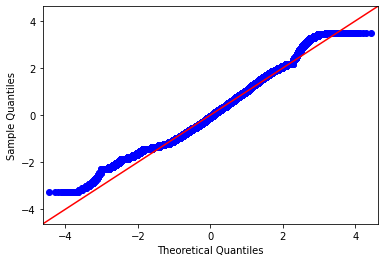

In [51]:
fig = sm.qqplot(data['age'], stats.t, fit=True, line="45")
plt.show()

In [52]:
#Mostrar promedio de white y black
edad_w=data[data['race_eth']=='Non-Hispanic white']['age']
edad_b=data[data['race_eth']=='Non-Hispanic black']['age']
print('Promedio white: '+str(edad_w.mean()))
print('Promedio black: '+str(edad_b.mean()))

Promedio white: 58.124035700113666
Promedio black: 58.53502958579882


In [53]:
#valor de t y p 
ttest,pval = ttest_ind(edad_w,edad_b)
print('Valor de t: '+str(ttest))
print('Valor p: '+ str(pval))

Valor de t: -5.010694327278149
Valor p: 5.428698623351847e-07


In [24]:
# Regla de decisión si el p valor es menor que la significancia escogida 
confianza=0.95
significancia=1-confianza
# Si se tiene menor valor se rechaza la hipótesis nula
if pval<significancia:
    print("Rechazar hipótesis nula")
else:
    print("No rechazar hipótesis nula")

Rechazar hipótesis nula


### 4.ANOVA

La idea básica detrás de un ANOVA de una vía es tomar muestras de cada grupo y luego calcular las medias muestrales para cada grupo. Luego, comparar la variación de las medias muestrales entre los grupos con la variación dentro de los grupos. 
Finalmente, podremos tomar una decisión basada en la estadística de prueba, si las medias de los grupos son todas iguales o no.

Teniendo claro nuestro objetivo de análisis vamos a realizar el análisis de la edad sobre todas las razas que entraron al estudio 

### 4.1. Hipótesis de ANOVA
El esquema simple de la prueba ANOVA :
Prueba F para diferencias en más de dos medias

$H₀: μ₁ = μ₂ = μ₃ =… $

$H₁:$ No todos los $μᵢ$ son iguales, donde $i = 1, 2, 3,….$

Nivel de significancia = $α$

donde μ es la media muestral del factor

En las siguientes líneas vamos a calcular los requistos necesarios para el cálculo de el test ANOVA
1. Calcular los tamaños de los grupos para la n
2. Calcular la varianza de los grupos
3. Crear la tabla con la suma de las varianzas

In [26]:
# Crear la estructura de tabla ANOVA 
data_col = [['SSA', '', '', '', '', ''], ['SSE', '', '', '', '', ''], ['Total', '', '', '', '', '']] 
anova_tabla = pd.DataFrame(data_col, columns = ['Fuente de variación', 'SS', 'gdl', 'MS', 'F', 'P-valor']) 
anova_tabla.set_index('Fuente de variación', inplace = True)
anova_tabla

,SS,gdl,MS,F,P-valor
Fuente de variación,,,,,
SSA,,,,,
SSE,,,,,
Total,,,,,


In [54]:
# Calcular la SSA y actualizamos la tabla
promedio_edad = data['age'].mean()
SSA = data.groupby('race_eth').count() * (data.groupby('race_eth').mean() - promedio_edad)**2
anova_tabla.at['SSA', 'SS'] = SSA['age'].sum()

# Calculas la SSE y actualizar en la tabla
SSE = (data.groupby('race_eth').count() - 1) * data.groupby('race_eth').std()**2
anova_tabla.at['SSE', 'SS'] = SSE['age'].sum()

# Calcular SST y actualizar en la tabla
SST = SSA['age'].sum() + SSE['age'].sum()
anova_tabla.at['Total', 'SS']= SST

Ya tenemos calculados nuestro $SST=SSA+SSE$

$32725467.06=284874.18 + 32440592.87$

Nuestros siguientes campos serán calcular:
* Grados de liberta (gdl)
* MS

In [31]:
# Calcular los grados de libertad
anova_tabla['gdl']['SSA'] = data['race_eth'].nunique() - 1
anova_tabla['gdl']['SSE'] = data.shape[0] - data['race_eth'].nunique()
anova_tabla['gdl']['Total'] = data.shape[0] - 1

In [55]:
# Calcular MS
anova_tabla['MS'] = anova_tabla['SS'] / anova_tabla['gdl']

In [56]:
# Calcular F 
F = anova_tabla['MS']['SSA'] / anova_tabla['MS']['SSE']
anova_tabla.at['SSA','F'] = F


In [57]:
# Calcular p-valor
anova_tabla.at['SSA','P-valor'] = 1 - stats.f.cdf(F, anova_tabla.at['SSA','gdl'], anova_tabla.at['SSE','gdl'])

In [58]:
# Visualizar tabla ANOVA
anova_tabla

,SS,gdl,MS,F,P-valor
Fuente de variación,,,,,
SSA,284874,6,47479,328.375,1.11022e-16
SSE,3.24406e+07,224366,144.588,,
Total,3.27255e+07,224372,145.854,,


In [41]:
# Evaluar la hipótesis con un nivel de confianza del 95% y significancia del 5%
alpha=0.05 #Establecer la significancia
# Evaluar la hipótesis
print("Usar el P-valor para decidir sobre la hipótesis")
if anova_tabla.at['SSA','P-valor'] <= alpha:
    conclusion = "Se rechaza hipótesis nula "
else:
    conclusion = "No se rechaza hipótesis nula "
print(conclusion)
print("Valor F es:", anova_tabla['F']['SSA'], " y el P-valor es:", anova_tabla['P-valor']['SSA'])    


Usar el P-valor para decidir sobre la hipótesis
Se rechaza hipótesis nula 
Valor F es: 328.3750138331336  y el P-valor es: 1.1102230246251565e-16


### Extensión

1. Realiza el gŕafico de barra con la variable BIRADS_breast_density

2. Realiza la comparación de independenia de edad con una muestra con las categorías de BIRADS_breast_density
En donde la categoría 1 y 2 son benignos
Categoría 3 y 4 son malignos

3. Realiza la tabla ANOVA para contrastar la hipótesis que el bmi es igual en todas las razas

4. Presente el análisis en forma de historia (video) 
herramnietas de video:
https://www.powtoon.com/?locale=es
https://www.canva.com/es_co/crear/videos/
https://www.animaker.es/